# Amsterdam Bike Accident Hotspot Analysis (2021–2023)

**All analysis in this notebook uses only the `gdf_ams_21_23.csv` dataset, which contains accident, weather, injury severity (`outcome`), and road situation data for Amsterdam (2021–2023).**

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
from sklearn.preprocessing import StandardScaler, LabelEncoder
import hdbscan

# Load the dataset 
df = pd.read_csv('../data/cleaned/gdf_ams_21_23.csv')
df.head()

,Unnamed: 0,accident_id,accident_year,outcome,num_parties,party1_type,party2_type,accident_nature,road_situation,built_up_area,...,road_surface,road_condition,light_condition,weather_condition,street_name,municipality,shape,geometry,longitude,latitude
0,58,20210077485,2021,Uitsluitend materiele schade,2,personenauto,bromfiets,Flank,"Kruispunt, 4 takken",Binnen,...,Unknown,Nat,Duisternis,Droog,Middenweg,amsterdam,POINT (124415.5298999995 484676.3922000006),POINT (4.938331880430102 52.3491439360283),4.938332,52.349144
1,91,20210081692,2021,Uitsluitend materiele schade,2,personenauto,e-bike,Frontaal,"Kruispunt, 3 takken",Binnen,...,Overig asfalt,Droog,Daglicht,Droog,Overschiestraat,amsterdam,POINT (117678.65309999883 484278.08260000125),POINT (4.83950635628552 52.34514797053482),4.839506,52.345148
2,106,20210081708,2021,Uitsluitend materiele schade,2,snorfiets,fiets,Frontaal,Rechte weg,Binnen,...,Overig asfalt,Droog,Daglicht,Droog,Rozenburglaan,amsterdam,POINT (124437.1950000003 483597.2190000005),POINT (4.938747822317208 52.33944619086022),4.938748,52.339446
3,154,20210080056,2021,Uitsluitend materiele schade,2,e-bike,landbouwvoertuig,Flank,"Kruispunt, 4 takken",Binnen,...,Overig asfalt,Droog,Daglicht,Droog,Th. K. van Lohuizenlaan,amsterdam,POINT (124961 486566),POINT (4.946168489078478 52.366156634505806),4.946168,52.366157
4,155,20210080070,2021,Uitsluitend materiele schade,2,personenauto,fiets,Flank,"Kruispunt, 4 takken",Binnen,...,Overig asfalt,Droog,Daglicht,Droog,Spuistraat,amsterdam,POINT (121107.48209999874 487274.5234000012),POINT (4.889521223504305 52.37230007491118),4.889521,52.372300


## 2. Data Exploration
Check the columns, missing values, and basic statistics.

In [7]:
df.info()
df.describe()
df.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5858 entries, 0 to 5857
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unnamed: 0         5858 non-null   int64  
 1   accident_id        5858 non-null   int64  
 2   accident_year      5858 non-null   int64  
 3   outcome            5858 non-null   object 
 4   num_parties        5858 non-null   int64  
 5   party1_type        5858 non-null   object 
 6   party2_type        5858 non-null   object 
 7   accident_nature    5858 non-null   object 
 8   road_situation     5858 non-null   object 
 9   built_up_area      5858 non-null   object 
 10  speed_limit_kmh    5858 non-null   object 
 11  street_lighting    5858 non-null   object 
 12  road_surface       5858 non-null   object 
 13  road_condition     5858 non-null   object 
 14  light_condition    5858 non-null   object 
 15  weather_condition  5858 non-null   object 
 16  street_name        5858 

Unnamed: 0           0
accident_id          0
accident_year        0
outcome              0
num_parties          0
party1_type          0
party2_type          0
accident_nature      0
road_situation       0
built_up_area        0
speed_limit_kmh      0
street_lighting      0
road_surface         0
road_condition       0
light_condition      0
weather_condition    0
street_name          0
municipality         0
shape                0
geometry             0
longitude            0
latitude             0
dtype: int64

## 3. HDBSCAN Clustering
Apply HDBSCAN to longitude and latitude to find accident hotspots.

In [10]:
coords = df[['longitude', 'latitude']].values
scaler = StandardScaler()
coords_scaled = scaler.fit_transform(coords)

clusterer = hdbscan.HDBSCAN(min_cluster_size=50, metric='euclidean')
df['cluster'] = clusterer.fit_predict(coords_scaled)
df['cluster'].value_counts()

/Users/volkan.coskun/esra/data/Week_9/Prediction_Bike_Accident/.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/volkan.coskun/esra/data/Week_9/Prediction_Bike_Accident/.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


cluster
 1    5387
-1     240
 0     231
Name: count, dtype: int64

## 5. Visualize Clusters (Folium Interactive Map)
Create an interactive map of the clusters.

In [12]:
m = folium.Map(location=[df['latitude'].mean(), df['longitude'].mean()], zoom_start=12)
marker_cluster = MarkerCluster().add_to(m)
for _, row in df.iterrows():
    folium.CircleMarker([row['latitude'], row['longitude']],
                        radius=3,
                        color='red' if row['cluster']!=-1 else 'gray',
                        fill=True,
                        fill_opacity=0.5,
                        popup=f"Cluster: {row['cluster']}").add_to(marker_cluster)
m.save('accident_clusters_21_23.html')
m

## 6. Predict Future Hotspots (Spatial Only)
Use cluster sizes and locations to estimate future hotspots. (Simple approach: clusters with most accidents are likely future hotspots.)

In [15]:
hotspot_counts = df[df['cluster']!=-1]['cluster'].value_counts().head(10)
hotspot_clusters = hotspot_counts.index.tolist()
df['future_hotspot_spatial'] = df['cluster'].apply(lambda x: 1 if x in hotspot_clusters else 0)
df['future_hotspot_spatial'].value_counts()

future_hotspot_spatial
1    5618
0     240
Name: count, dtype: int64

## 7. Predict Future Hotspots (Spatial + Weather + Injury + Road Situation)
Use a simple model (e.g., RandomForest) to predict future hotspots using spatial, weather, injury severity (`outcome`), and road situation features. Categorical columns are encoded as needed.

In [39]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder

# Encode categorical columns
df_model = df.copy()
for col in ['weather_conditions', 'road_conditions', 'outcome']:
    if col in df_model.columns:
        le = LabelEncoder()
        df_model[f'{col}_encoded'] = le.fit_transform(df_model[col].astype(str))

# Select features
feature_cols = ['longitude', 'latitude']
for col in ['weather_conditions_encoded', 'road_conditions_encoded', 'outcome_encoded']:
    if col in df_model.columns:
        feature_cols.append(col)

X = df_model[feature_cols]
y = df_model['future_hotspot_spatial']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred))
df_model['future_hotspot_pred'] = clf.predict(X)
df_model.to_csv('../data/cleaned/df_model.csv')

              precision    recall  f1-score   support

           0       0.95      0.80      0.87        46
           1       0.99      1.00      1.00      1126

    accuracy                           0.99      1172
   macro avg       0.97      0.90      0.93      1172
weighted avg       0.99      0.99      0.99      1172



In [34]:
import folium
def popup_text(row):
    pred = "Future Hotspot" if row['future_hotspot_pred'] == 1 else "Not Hotspot"
    return (
        f"<b>Prediction:</b> {pred}<br>"
        f"<b>Longitude:</b> {row['longitude']}<br>"
        f"<b>Latitude:</b> {row['latitude']}<br>"
        f"<b>Weather:</b> {row.get('weather_conditions', 'N/A')}<br>"
        f"<b>Road:</b> {row.get('road_conditions', 'N/A')}<br>"
        f"<b>Outcome:</b> {row.get('outcome', 'N/A')}"
    )

for _, row in df_model.iterrows():
    color = 'red' if row['future_hotspot_pred'] == 1 else 'blue'
    folium.CircleMarker(
        [row['latitude'], row['longitude']],
        radius=5,  # slightly larger for visibility
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=folium.Popup(popup_text(row), max_width=300)
    ).add_to(marker_cluster)

In [36]:

m2.save('future_hotspots_21_23.html')
m2

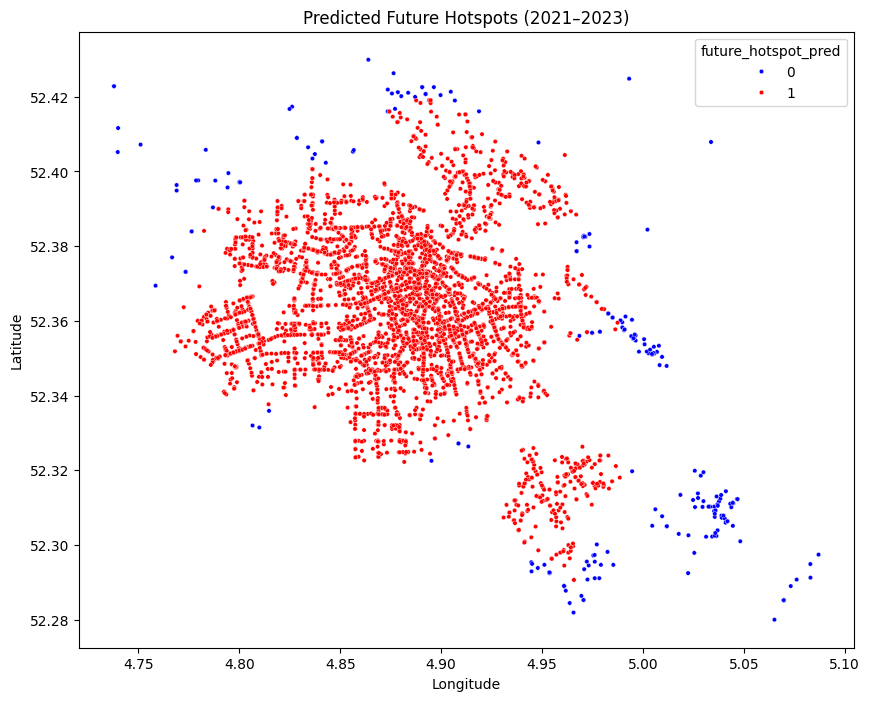

In [29]:
plt.figure(figsize=(10,8))
sns.scatterplot(data=df_model, x='longitude', y='latitude', hue='future_hotspot_pred', palette={1:'red',0:'blue'}, s=10, legend='full')
plt.title('Predicted Future Hotspots (2021–2023)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.savefig('future_hotspots_21_23.png', dpi=200)
plt.show()